<a href="https://colab.research.google.com/github/wallik3/reinforcement-101/blob/main/q_learning_with_grid_travel_game.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Grid Travel
- Solve Grid Travel using Q-Learning, Everything was implemented from scratch (using pandas, numpy)
- Q-Learning is one of the algorithms in Reinforcement Learning
- Agent Goal is to travel to the cell with the highest reward within fastest time, their learning memory is stored in Q- Table
- Q Table tells the quality score for each action given state. The agent will move by the action with highest quality score.



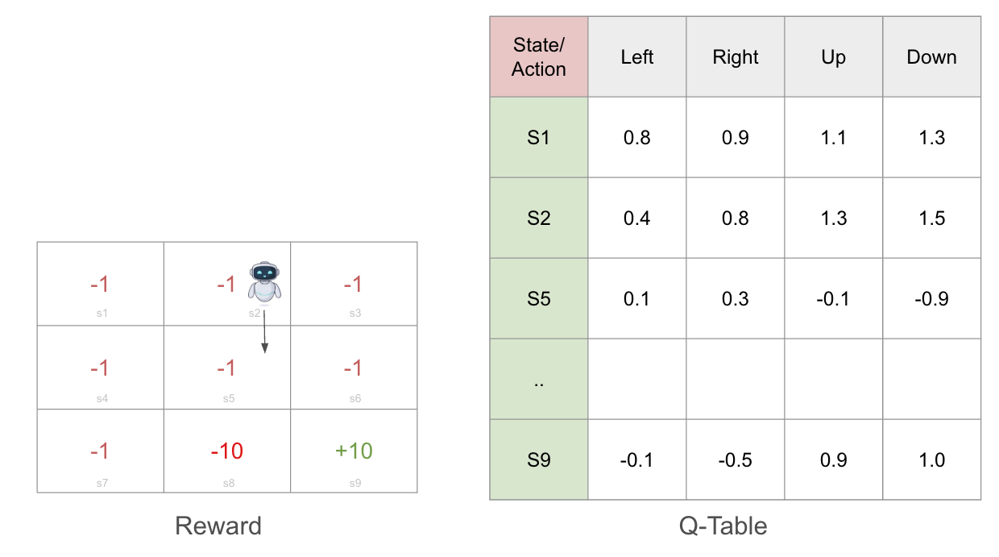

In [347]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import cm
from matplotlib.colors import Normalize


from IPython.display import Image
from matplotlib.cm import ScalarMappable
from collections import namedtuple
from typing import Literal, List, Dict

In [362]:
ReplayBuffer = namedtuple('ReplayBuffer', ['state', 'action', 'next_state', 'terminate'])

def display_replay_buffer(replay_buffers, reward_array):
    # Detect grid size dynamically
    grid_width, grid_height = reward_array.shape

    # Helper: Get grid position for given state
    def state_to_pos(state):
        y, x = state_to_location_mapper[state]  # (row, col)
        return x, y  # Return (x, y) for plotting

    # Flatten episodes into (episode_index, transition) pairs, starting with initial state
    all_steps = []
    for ep_idx, episode in enumerate(replay_buffers):
        sum_reward = 0
        initial_state = episode[0].state
        x, y = state_to_location_mapper[episode[0].state]
        reward = reward_array[y, x]
        all_steps.append((ep_idx, initial_state, None, None, reward))
        for step in episode:
            x, y = state_to_location_mapper[step.state]
            reward = reward_array[y, x]
            sum_reward += reward
            all_steps.append((ep_idx, step.next_state, step.action, step.terminate, sum_reward))
        all_steps.append((ep_idx, None, None, None, sum_reward))  # Pause

    # Setup plot
    fig, ax = plt.subplots()
    ax.set_xlim(-0.5, grid_width - 0.5)
    ax.set_ylim(-0.5, grid_height - 0.2)
    ax.set_xticks(range(grid_width))
    ax.set_yticks(range(grid_height))
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # Normalize rewards for color mapping
    vmin, vmax = reward_array.min(), reward_array.max()
    norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.RdYlGn

    # Draw grid cells with background color based on reward
    for x in range(grid_width):
        for y in range(grid_height):
            reward = reward_array[x, y]
            color = cmap(norm(reward))
            rect = plt.Rectangle((x - 0.5, grid_height - y - 1 - 0.5), 1, 1,
                                 linewidth=1, edgecolor='black', facecolor=color)
            ax.add_patch(rect)

    # Draw reward values in each cell
    for x in range(grid_width):
        for y in range(grid_height):
            reward = reward_array[x, y]
            ax.text(x, grid_height - y - 1, str(reward), ha='center', va='center', fontsize=12, color='black')

    # Agent and labels
    agent_dot, = ax.plot([], [], 'ro', markersize=20)
    action_text = ax.text(grid_width / 2, grid_height + 0.2, '', ha='center', va='center', fontsize=14, color='blue')
    episode_text = ax.text(0.0, grid_height + 0.2, '', ha='left', va='center', fontsize=12, color='black')
    reward_text = ax.text(grid_width / 2, grid_height-0.2, '', ha='center', va='bottom', fontsize=12, color='black')

    # Update function for animation
    def update(frame):
        ep_idx, state_or_step, action, terminate, sum_reward = all_steps[frame]
        if state_or_step is None:
            agent_dot.set_data([], [])
            action_text.set_text('')
            episode_text.set_text(f"Episode {ep_idx + 1} done.")
        else:
            x, y = state_to_pos(state_or_step)
            y = grid_height - y - 1  # Flip y for display
            agent_dot.set_data([x], [y])
            agent_dot.set_color('green' if terminate else 'red')
            action_text.set_text(f"Action: {action}" if action is not None else '')
            reward_text.set_text(f"Reward : {sum_reward}" if action is not None else '')
            episode_text.set_text(f"Episode: {ep_idx + 1}")
        return agent_dot, action_text, episode_text

    # Animate
    ani = animation.FuncAnimation(fig, update, frames=len(all_steps), interval=100)

    # Save and display
    gif_path = "multi_episode_agent.gif"
    ani.save(gif_path, writer='pillow')
    plt.close()
    display(Image(filename=gif_path))


In [349]:
# replay_buffers_ = replay_buffers[-5:]

# display_replay_buffer(replay_buffers_,reward_array)

# Customize your game here
- Reward Array (Default : 3x3 size, with different)
- Terminate State - The game is ended if the agent moves into these states
- Possible Initial State : The start point of the game, can be randomly chosen for different game

Ps. Terminology "Game" in RF Learning is called "Episode"

In [350]:
# Config your game here
reward_array = np.array([
    [-1,-1,-1],
    [-1,-1,-1],
    [-1,-1000,1000]
])
# Big lesson : Forget that the way we called reward is not (x,y) but (y,x), hence we transpose

# terminate_states = [8,9]
terminate_states = [8,9]
lose_state = [8] # Optional

# For training purpose for each episode
possible_initial_states = [1,2,3,4,5,6,7]

## Setup
- Define the rules of the game, contains the state & action of the game. Normally, you don't have to edit these, unless you want to, here's how you can

  - Action : Maybe you want to add action like "do nothing", however, make sure to update the method **move** in class **Agent** object (was declared below) by how the state is changed if they did that action.

  - State : - (Nothing to edit, since it is dynamically depended on Reward Array)
  



- Ps. You could edit the action here,

In [351]:
# The rest of these will automatically be generated
# Set up Math Part

actions = ["left","right","up","down"]
states = list(range(1,reward_array.size+1))

n_action = len(actions)
n_state = reward_array.size

# Typing
State = Literal[*states]
Action = Literal[*actions]

In [352]:
states

[1, 2, 3, 4, 5, 6, 7, 8, 9]

In [353]:
# Set up Math Part
# This is learnable parameter
def get_initial_q_table(states:List[str], actions:List[str])->pd.DataFrame:

  n_state = len(states)
  n_action = len(actions)
  # Q_table = np.zeros(shape=(n_state,n_action))
  Q_table = np.random.uniform(low=-1,high=1,size=(n_state,n_action))
  Q_table = pd.DataFrame(Q_table, columns=actions, index=states)
  Q_table.index.name = 'state'
  return Q_table

Q_table = get_initial_q_table(states, actions)
display(Q_table)

,left,right,up,down
state,,,,
1,0.568369,-0.139248,0.639164,-0.091415
2,-0.201058,0.197948,0.989648,0.011573
3,-0.321062,-0.281651,-0.931470,-0.617501
4,0.659622,0.092935,-0.410204,0.260480
5,-0.435889,0.503185,0.463463,-0.211880
6,0.870658,0.582084,-0.663369,-0.166184
7,-0.552215,0.522906,-0.587317,-0.008260
8,-0.799234,-0.414456,-0.447370,0.379284
9,-0.471126,0.614646,-0.686842,0.070548


In [354]:
# Set up Algorithm Part

def reverse_dict(d):
    return {v: k for k, v in d.items()}

def get_location_to_state_mapper(reward_array):
    rows, cols = reward_array.shape
    location_to_state_mapper = {
        (i, j): i * cols + j + 1
        for i in range(rows)
        for j in range(cols)
    }
    state_to_location_mapper = {v: k for k, v in location_to_state_mapper.items()}
    return location_to_state_mapper, state_to_location_mapper


location_to_state_mapper, state_to_location_mapper = get_location_to_state_mapper(reward_array)
print(state_to_location_mapper)

{1: (0, 0), 2: (0, 1), 3: (0, 2), 4: (1, 0), 5: (1, 1), 6: (1, 2), 7: (2, 0), 8: (2, 1), 9: (2, 2)}


In [355]:
# Set up Algorithm Part
class Agent:
  def __init__(self, initial_state:State):
    self.set_state(initial_state)

  def set_state(self, state:State):
    self.state = state
    self.state_location = state_to_location_mapper[state]

    self.prev_state = self.state
    self.prev_state_location = self.state_location

  def move(self, action:Action):
    self.prev_state = self.state
    self.prev_state_location = self.state_location

    y,x = self.state_location

    if action == "left":
      x-=1

    elif action == "right":
      x+=1

    elif action == "up":
      y-=1

    elif action == "down":
      y+=1

    # In case you add action "do nothing", please uncomment this
    # elif action == "do nothing":
    #       pass

    x = int(np.clip(x,0, reward_array.shape[1]-1))
    y = int(np.clip(y,0, reward_array.shape[0]-1))

    self.state_location = (y,x)
    self.state = location_to_state_mapper[self.state_location]

  def is_terminate(self):
     return self.state in terminate_states

  # You can add reward_array, q_table as their attribute here

# Q-Learning Algorithm
  ---
  1. For each episode, update the Q-table:

  A. Initialize the starting state

  B. From the current **state (S)**, choose the **action (A)** with the highest Q-value

  C. Perform action A, move to the **next state (S')**

    - Update Q(S, A) using the formula:

      - Q(S, A) ← Q(S, A) - α × TD_Error
      Where:

      - **α** is the learning rate
      - **TD_Error = Q_observed - Q_expected**

        - `Q_observed = Q(S, A)`
        - `Q_expected = R(S) + γ maxₐ Q(S', a')`

          - **R(S)**: Reward for being in state S  
          - `maxₐ Q(S', a')`: Best Q-value for the next state across all possible actions

      D. If the next state **S'** is terminal, end the episode

  ---

  2. Repeat step 1 for `n_episodes` times

  ---

  ## Notes

  - **Q** is a learnable table, initialized with low-quality estimates and improved during training
  - **R** is the predefined reward function
  - `maxₐ Q(S', a')` estimates the best future Q-value from the next state
  - **Q_expected** follows the **Bellman equation**, predicting future rewards
  - **TD Error** (Temporal Difference Error) measures the difference between the current and expected Q-values
  - **Discount Factor (γ)**: A value between 0 and 1  
    - It controls the importance of future rewards  
    - The more steps the agent takes to reach a terminal state, the more the future rewards are discounted (i.e., penalized)


In [356]:
from collections import Counter

def train(agent, n_episode=50):
  # Our goal is to update q table, not agent itself
  # 1 train have many episode
  global Q_table
  episode_results = []
  replay_buffers = []

  for episode in range(1,n_episode+1):
    initial_state = np.random.choice(possible_initial_states)
    print(f"\nEpisode {episode}")
    print(f"\t Start at state : {initial_state}")

    agent.set_state(initial_state)
    agent, episode_result, replay_buffer = train_episode(agent)
    episode_results.append(episode_result)
    replay_buffers.append(replay_buffer)

    print("\t Episode result : ")
    counter = Counter(episode_results)
    print(f"Win Rate : {counter['win'] / len(episode_results)}")

  return replay_buffers

def train_episode(agent:Agent, moves_limit=None):
  # 1 episode have many moves
  move = 0
  # Save replay buffer
  replay_buffer = []
  while not agent.is_terminate():
    # Given state, Get the action with highest q
    next_action = Q_table.loc[agent.state].idxmax()

    agent = train_move(agent, next_action)
    print(f"\tSelect best next action : {next_action}, Move to state {agent.state}")

    replay_buffer.append(ReplayBuffer(agent.prev_state, next_action, agent.state, agent.is_terminate()))

    move += 1
    # Check if timeout
    if moves_limit:
      if moves_limit == move:
        break

  # Summarize the game result
  if agent.state in lose_state:
    episode_result = "lose"

  elif agent.state in terminate_states:
    episode_result = "win"

  else:
    episode_result = "timeout"

  return agent, episode_result, replay_buffer

def train_move(agent:Agent, action:Action):
  global Q_table, reward_array

  # Move the agent
  agent.move(action)

  # Step 2 : Calculate Temporal Difference (TD) Error
  q_observed = Q_table.loc[agent.prev_state, action]

  # Calculate q_expected
  # reward = reward_array[*agent.prev_state_location]
  reward = reward_array[agent.state_location[0], agent.state_location[1]]
  max_q_next = Q_table.loc[agent.state].max()

  q_expected = reward + (discount_factor * max_q_next)

  # td_error = np.sqrt(q_observed - q_expected)**2
  td_error = q_observed - q_expected

  # Step 3 : Update Q Table
  Q_table.loc[agent.prev_state, action] -= learning_rate*td_error

  return agent

In [358]:
# # Config your training
learning_rate = 0.7
discount_factor = 0.9 # Range(0,1) - lower : reduce agent move's count

Q_table = get_initial_q_table(states,actions)
agent = Agent(1)

replay_buffers = train(agent, n_episode=25)


Episode 1
	 Start at state : 6
	Select best next action : left, Move to state 5
	Select best next action : up, Move to state 2
	Select best next action : down, Move to state 5
	Select best next action : right, Move to state 6
	Select best next action : up, Move to state 3
	Select best next action : down, Move to state 6
	Select best next action : left, Move to state 5
	Select best next action : up, Move to state 2
	Select best next action : down, Move to state 5
	Select best next action : right, Move to state 6
	Select best next action : right, Move to state 6
	Select best next action : up, Move to state 3
	Select best next action : left, Move to state 2
	Select best next action : up, Move to state 2
	Select best next action : left, Move to state 1
	Select best next action : left, Move to state 1
	Select best next action : down, Move to state 4
	Select best next action : up, Move to state 1
	Select best next action : up, Move to state 1
	Select best next action : left, Move to state 1

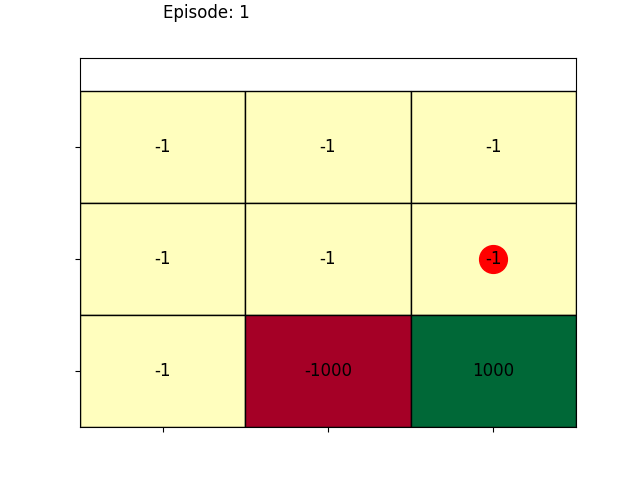

In [363]:
display_replay_buffer(replay_buffers, reward_array.T)

In [240]:
# See the result : This is basically an agent brain
# At state 7, the q-score is extremely low, this is because TD Error return very low value
Q_table

,left,right,up,down
state,,,,
1,-1.464845,-1.470056,-1.414317,719.705475
2,-1.431457,-0.999598,-1.492425,784.894515
3,-1.261972,-0.273651,-0.603849,-1.048962
4,-1.786421,808.339599,-1.367706,-1.831744
5,-0.906071,899.266750,-0.712336,-0.786212
6,-0.657657,-0.877611,-0.989577,1000.296388
7,-2.104058,-699.786360,710.971386,-2.394270
8,-0.591538,-0.888521,-0.021743,-0.284289
9,-0.316587,-0.000776,-0.192400,0.329321


At the very first episode, you can see that the agent is confusing what are they doing 😆, and they even fall into the worst state (with reward -1000), they learn to avoid in later episode, and seem to find the way to the best reward cell within fastest time

Challenge : Edit code to change reward, and extend the reward array to be larger than 3x3, and terminal state if you want to change new map instead of 3x3

---

# Try it yourself
- You can extend reward array to be larger


Episode 1
	 Start at state : 2
	Select best next action : right, Move to state 3
	Select best next action : up, Move to state 3
	Select best next action : right, Move to state 4
	Select best next action : left, Move to state 3
	Select best next action : right, Move to state 4
	Select best next action : up, Move to state 4
	Select best next action : down, Move to state 8
	 Episode result : 
Win Rate : 0.0

Episode 2
	 Start at state : 3
	Select best next action : up, Move to state 3
	Select best next action : right, Move to state 4
	Select best next action : up, Move to state 4
	Select best next action : left, Move to state 3
	Select best next action : up, Move to state 3
	Select best next action : right, Move to state 4
	Select best next action : up, Move to state 4
	Select best next action : right, Move to state 4
	Select best next action : left, Move to state 3
	Select best next action : down, Move to state 7
	 Episode result : 
Win Rate : 0.5

Episode 3
	 Start at state : 3
	Select

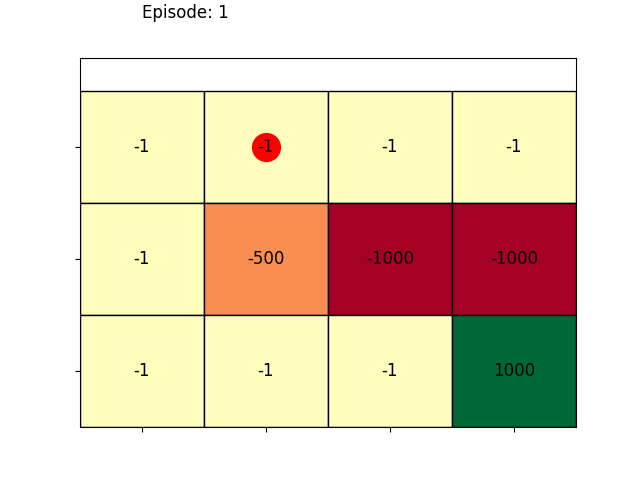

In [367]:
# Code to update
reward_array = np.array([
    [-1,-1,-1, -1], # 50 is
    [-1,-500,-1000, -1000], #(2,1)
    [-1,-1,-1 ,1000]
])

possible_initial_states = [1,2,3,4,9]
terminate_states = [12,7,8]
states = list(range(1,reward_array.size+1))


location_to_state_mapper, state_to_location_mapper = get_location_to_state_mapper(reward_array)

n_state = reward_array.size

Q_table = get_initial_q_table(states,actions)

# Train
learning_rate = 0.5
discount_factor = 0.5 # Range(0,1) - lower : reduce agent move's count
agent = Agent(1)
replay_buffers = train(agent, n_episode=25)

display_replay_buffer(replay_buffers, reward_array.T)

In [296]:
def get_random_initial_and_terminate_states(reward_array):
  possible_initial_states = []
  terminate_states = []
  for j in range(reward_array.shape[0]):
    for i in range(reward_array.shape[1]):
      state = location_to_state_mapper[(j,i)]
      if reward_array[j,i] == -1:
        # chance 0.8 that will be in init state
        if np.random.uniform(0,1) <= 0.8:
          possible_initial_states.append(state)

      elif reward_array[j,i] == -1000 or reward_array[j,i] == 1000:
          terminate_states.append(state)

  return possible_initial_states, terminate_states

In [364]:
# Warning : If the agent seems to stuck one of the state, it might infer that there is no way to reach terminate state
# For example
# [[1000,-1000,-1],
# [-1000,-1,-1],
# [-1,-1,-1]]
# If that so, please interrupt and regenerate the reward_array

# Define allowed values and their probabilities
reward_values = [-1, -1000, -200]
reward_probs = [0.8, 0.10, 0.10]
state_size=(7, 7)

# Generate the array
reward_array = np.random.choice(reward_values, size=(state_size[0], state_size[1]), p=reward_probs)

# Adding two cell with reward 1000
for i in range(2):
  reward_location_x = np.random.choice(list(range(0,state_size[0])))
  reward_location_y = np.random.choice(list(range(0,state_size[1])))
  reward_array[reward_location_y, reward_location_x] = 1000

location_to_state_mapper, state_to_location_mapper = get_location_to_state_mapper(reward_array)

possible_initial_states, terminate_states = get_random_initial_and_terminate_states(reward_array)
states = list(range(1,reward_array.size+1))


location_to_state_mapper, state_to_location_mapper = get_location_to_state_mapper(reward_array)

n_state = reward_array.size

Q_table = get_initial_q_table(states,actions)

# Train
learning_rate = 0.5
discount_factor = 0.5 # Range(0,1) - lower : reduce agent move's count
agent = Agent(1)
replay_buffers = train(agent, n_episode=200)


Episode 1
	 Start at state : 41
	Select best next action : right, Move to state 42
	Select best next action : down, Move to state 49
	Select best next action : down, Move to state 49
	Select best next action : left, Move to state 48
	Select best next action : up, Move to state 41
	Select best next action : down, Move to state 48
	Select best next action : down, Move to state 48
	Select best next action : right, Move to state 49
	Select best next action : down, Move to state 49
	Select best next action : left, Move to state 48
	Select best next action : up, Move to state 41
	Select best next action : right, Move to state 42
	Select best next action : down, Move to state 49
	Select best next action : right, Move to state 49
	Select best next action : up, Move to state 42
	Select best next action : right, Move to state 42
	Select best next action : left, Move to state 41
	Select best next action : down, Move to state 48
	Select best next action : down, Move to state 48
	Select best next 

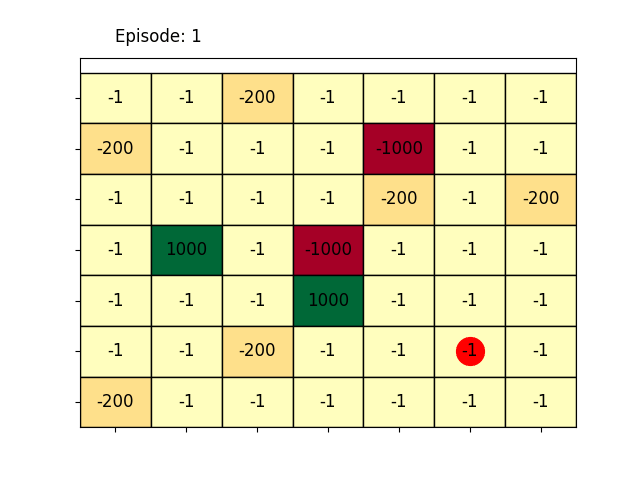

In [365]:
display_replay_buffer(replay_buffers, reward_array.T)

In [329]:
Q_table

,left,right,up,down
state,,,,
1,-1.128267,122.834070,-1.107368,-0.996185
2,-0.938452,248.558619,-0.912261,-9.701453
3,-0.725753,-9.514913,-0.965662,499.126815
4,-0.335672,-499.427880,0.887962,-0.053384
5,0.280966,-0.210646,0.235439,0.312859
6,-499.745231,-0.844570,-0.592436,248.480199
7,112.385755,-1.137812,-1.101342,-1.078733
8,-1.369530,-10.232565,52.782246,-1.476412
9,-0.436850,-0.679929,-0.571950,-0.650610


# What you might learn from this
- it is possible that the agent is overfit to one of the action given the state, to resolve this (closed-mind agent), to resolve this problem, we can implement e-greedy policy.

  - The idea is simple, instead of let
  
  ```
  next_action = Q_table.loc[agent.state].idxmax()
  ```

  We let
  
  ```
  next_action_exploitation = Q_table.loc[agent.state].idxmax()
  next_action_exploration = np.random.choice(actions)

  next_action = next_action_exploration if np.random.choice >= 0.95 else next_action_exploitation
  ```

- The larger the state is, the higher `n_episode` you need, which guarantee that q-score for every state is once updated

- Imagine there is more than 1000 states, using Q-Learning could take too much time, we introduce Deep-Q Learning, see the next notebook
